# Atrial Fibrillation Project - EDA (Raw Data)

Student Name: Michael (s2767708) & Pedro da Silva (s2799057)

Group No: 123

In [12]:
# Import libraries
import pandas as pd
pd.options.display.max_columns = None
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
pd.set_option('display.width', None)
import numpy as np
from scipy import stats
import os
import glob
import datetime
import sweetviz as sv
from tqdm.auto import tqdm

import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px

# Suppress the warnings
import warnings
warnings.filterwarnings(action='ignore')

print('Imported all libraries successfully.')

Imported all libraries successfully.


In [13]:
current_path = os.getcwd()
current_path

'C:\\Users\\HP\\Desktop\\MASTER\\UniversityofTwente\\Master\\202302 Q2\\Data Science\\Project\\AF'

In [14]:
# Define a function to read the raw txt files
def read_files(filename):
    with open(filename, 'r') as file:
        data = file.read().splitlines()
        data = map(lambda x: x.rstrip().lstrip().split(), data)
        data = [list(map(str, line)) for line in data]
        return data

## ECG Data

In [15]:
ecg_txt_paths = ['C:\\Users\\HP\\Desktop\\MASTER\\UniversityofTwente\\Master\\202302 Q2\\Data Science\\Project\\AF\\dataset\\ECG_Data\\Data2.txt']

In [16]:
# Append all ECG files into a list
ecg_files = []
for ecg_txt in tqdm(ecg_txt_paths):
    ecg_file = read_files(ecg_txt)
    ecg_files.append(ecg_file)

  0%|          | 0/1 [00:00<?, ?it/s]

In [17]:
# Convert the list into a DataFrame
ecg_df = pd.DataFrame()

for i in range(0, len(ecg_files)):
    ecg_part = pd.DataFrame(ecg_files[i])
    
    # Create a single "annotation" column to join all annotations
    ecg_part['annotation'] = ecg_part[ecg_part.columns[3:]].apply(lambda x: ' '.join(x.dropna().astype(str)), axis=1)
    
    # Drop the old annotation columns, keep the merged annotation column in the last position
    ecg_part.drop(ecg_part.iloc[:,3:(len(ecg_part.columns)-1)], axis=1, inplace=True)
    
    # Trim the white spaces in the annotation column
    ecg_part['annotation'] = ecg_part['annotation'].str.strip()
    
    # Append the ecg partitions into a single DataFrame
    ecg_df = ecg_df.append(ecg_part)

# Rename the final columns
col_name = ['time', 'rr_interval', 'heartbeat_type', 'annotation']
ecg_df.columns = col_name
ecg_df['rr_interval'] = ecg_df['rr_interval'].astype(int)
    
print(ecg_df.shape)
ecg_df.head()

(105659, 4)


,time,rr_interval,heartbeat_type,annotation
0,16:00:11,935,N,
1,16:00:12,810,N,
2,16:00:13,815,N,
3,16:00:14,815,N,
4,16:00:15,815,N,


                                             |          | [  0%]   00:00 -> (? left)


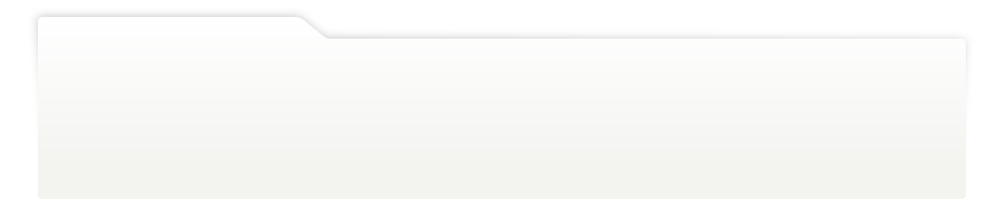
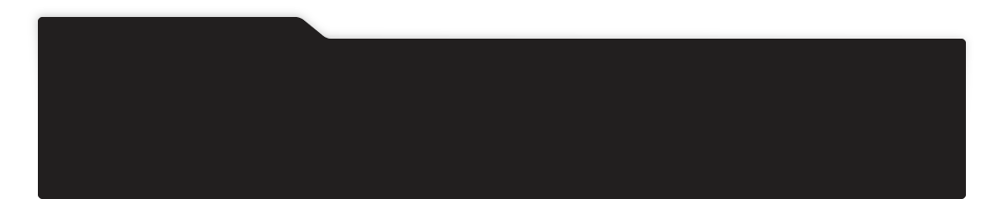
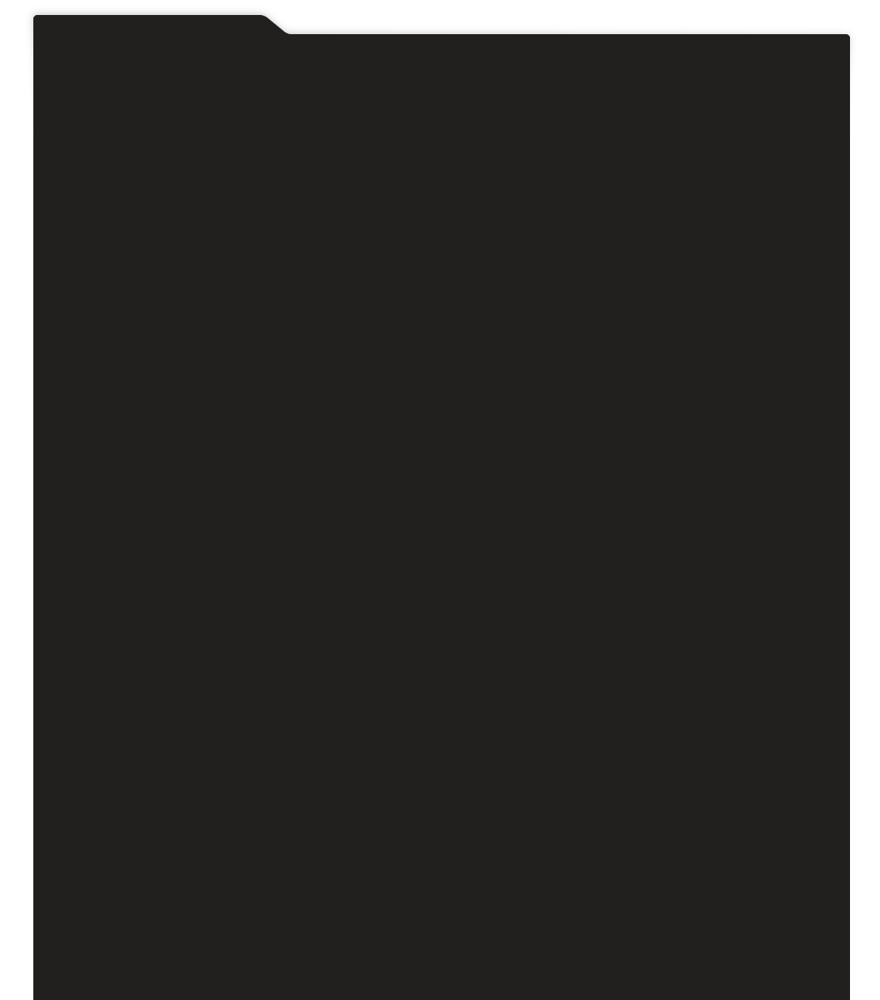
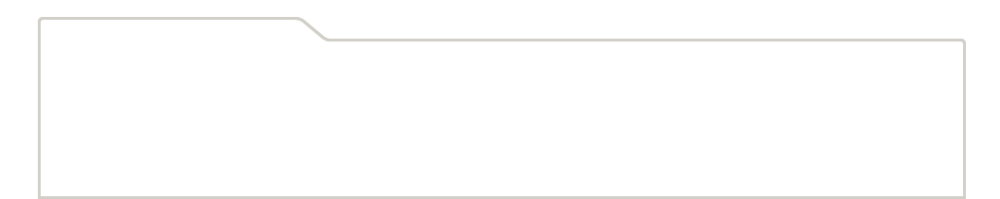
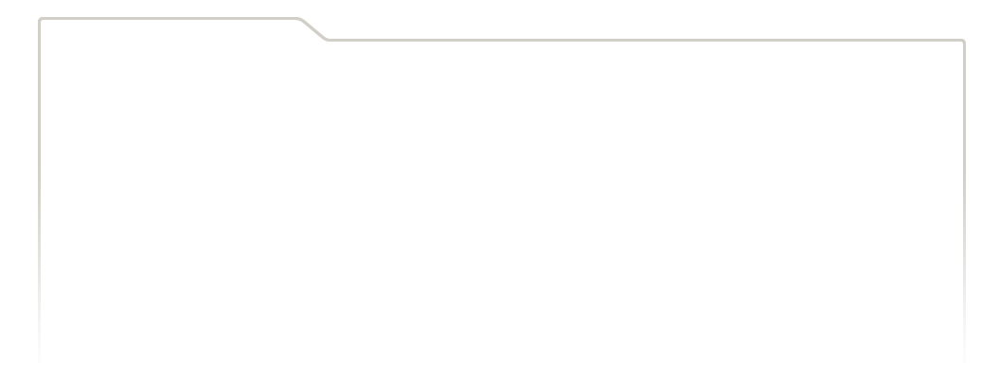
...
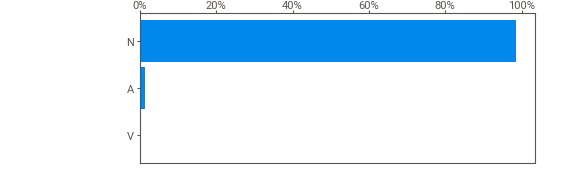
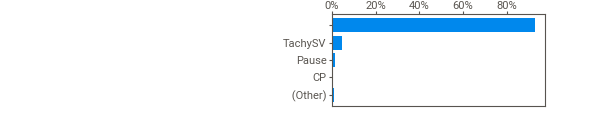
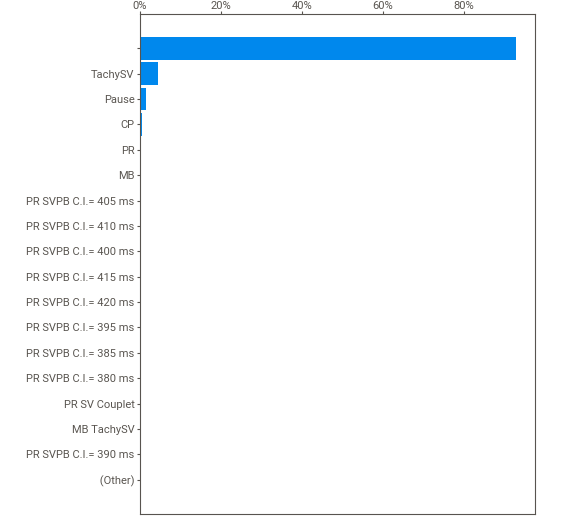
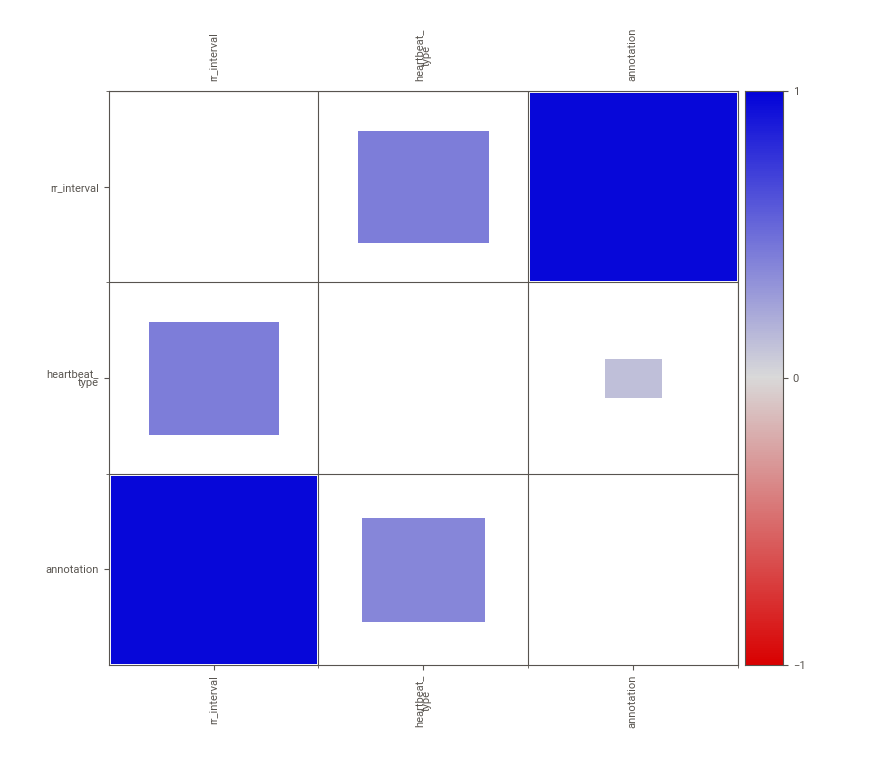
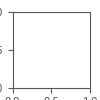

In [18]:
# Generate visual EDA report using Sweetviz 
sv_ecg_df = sv.analyze([ecg_df, 'ECG Data'])
sv_ecg_df.show_notebook(layout='widescreen', scale=0.8)

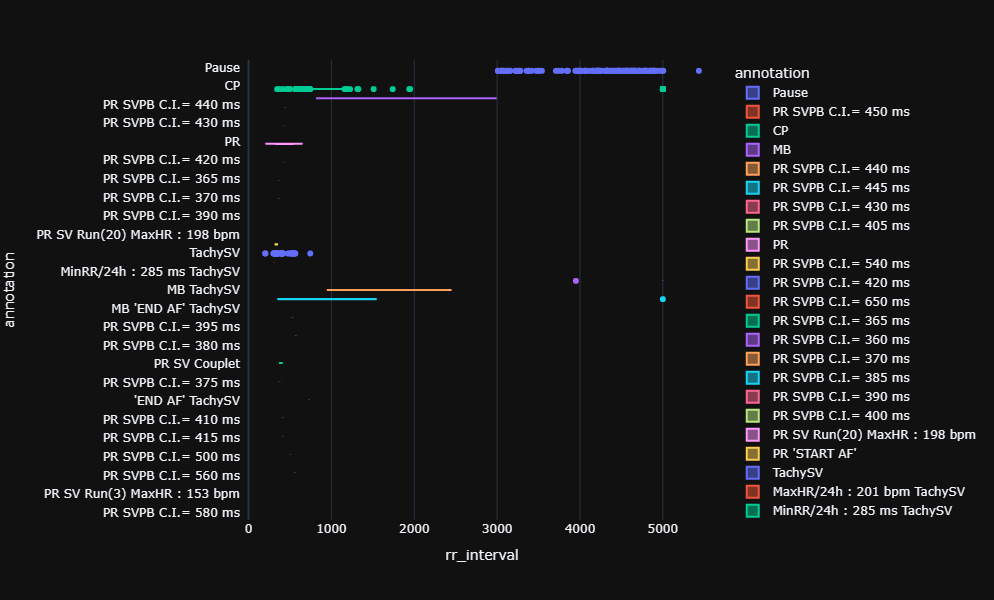

In [19]:
# Check the rr_interval distribution of observation with annotations
fig = px.box(ecg_df[ecg_df['annotation'] != ''], x='rr_interval', y='annotation', color='annotation',
             template='plotly_dark', boxmode='group',
             height=600, width=1200)

# Show the plot
fig.show()

In [20]:
# Keep the rows where there are no annotations
print('before:', ecg_df.shape)
ecg_df = ecg_df[ecg_df['annotation']=='']
print('after:', ecg_df.shape)

before: (105659, 4)
after: (98184, 4)


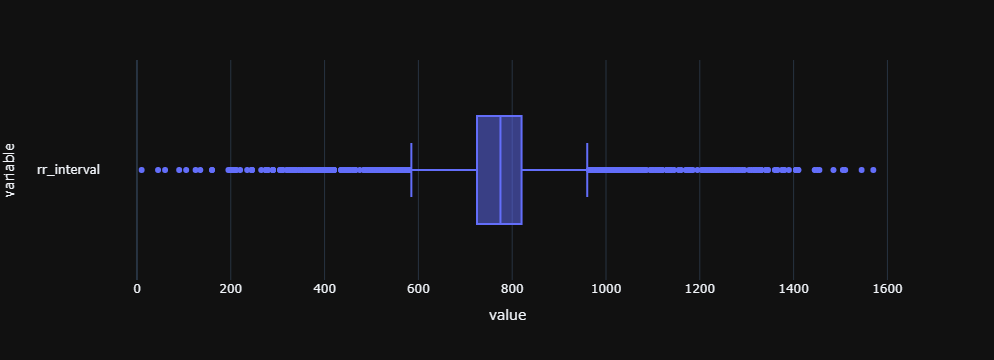

In [21]:
# Check the rr_interval distribution
fig = px.box(ecg_df['rr_interval'], orientation='h', template='plotly_dark')

# Show the plot
fig.show()

In [22]:
# Handle outliers
print('before:', ecg_df.shape)
ecg_df = ecg_df.loc[(ecg_df['rr_interval'] >= 100) & (ecg_df['rr_interval'] <= 1600)]
print('after:', ecg_df.shape)

before: (98184, 4)
after: (98180, 4)


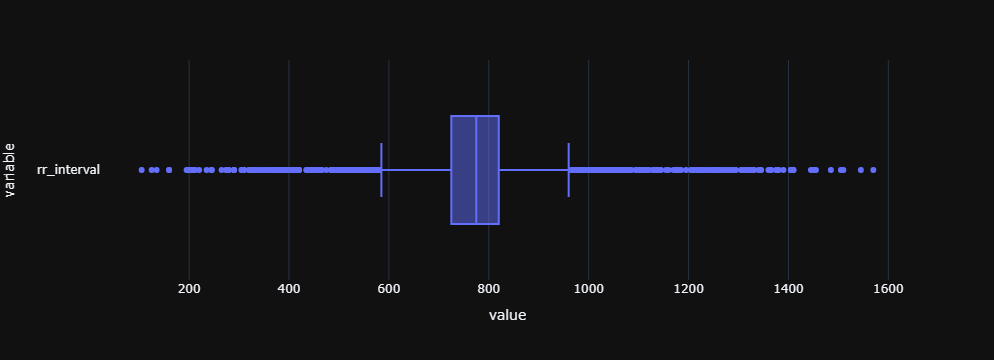

In [23]:
# Check the rr_interval distribution
fig = px.box(ecg_df['rr_interval'], orientation='h', template='plotly_dark')

# Show the plot
fig.show()

                                             |          | [  0%]   00:00 -> (? left)


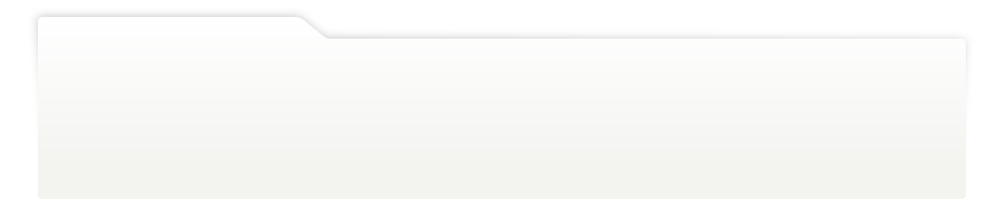
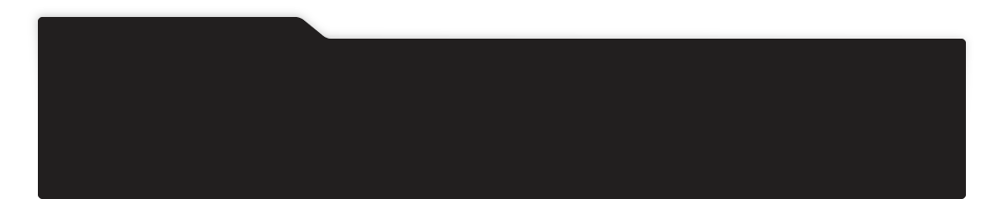
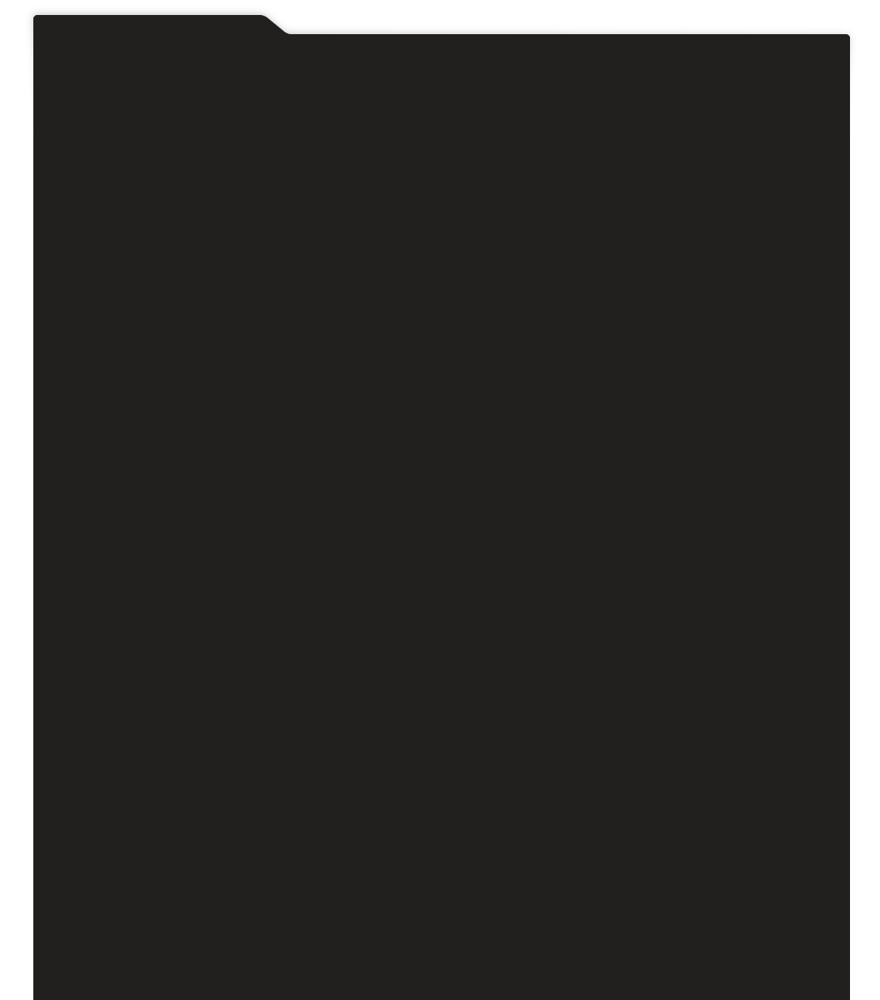
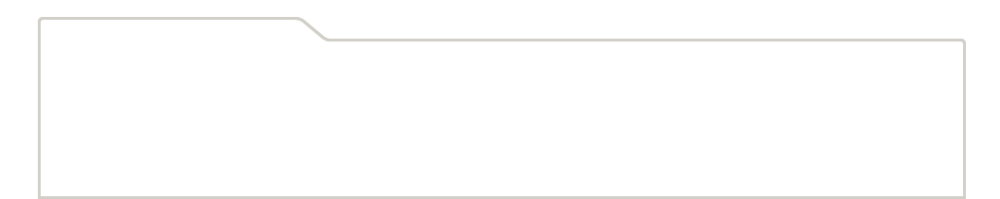
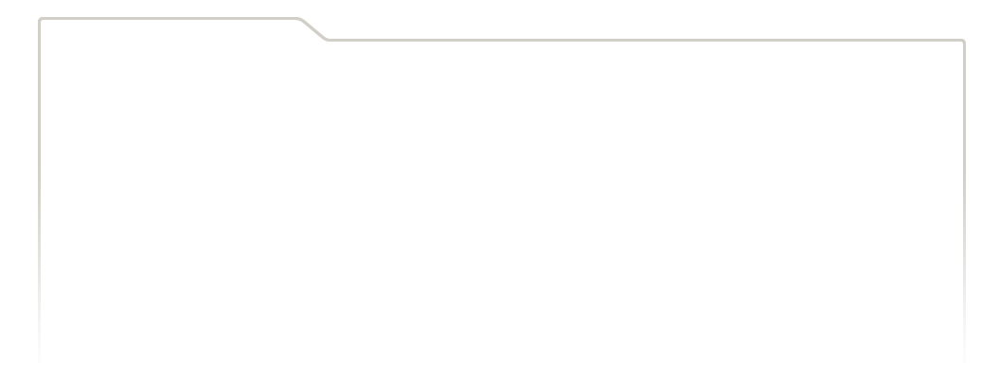
...
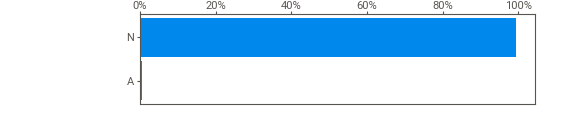
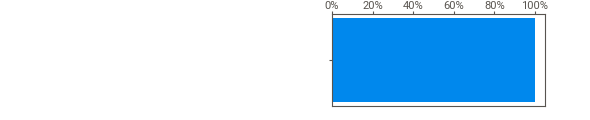
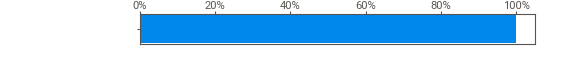
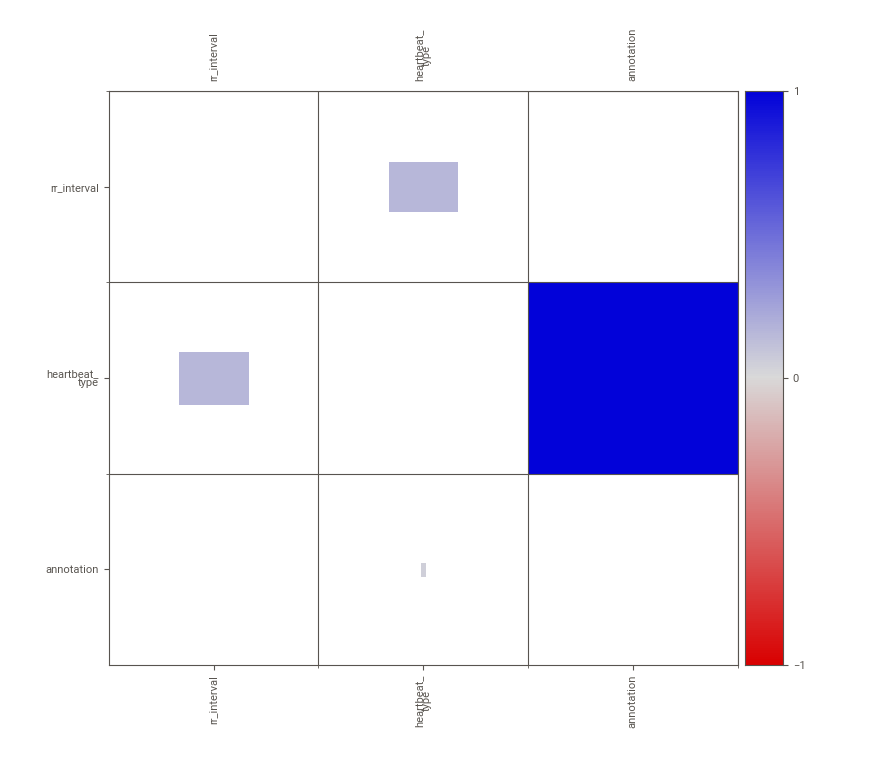
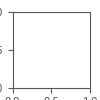

In [24]:
# Generate visual EDA report using Sweetviz 
sv_ecg_df = sv.analyze([ecg_df, 'ECG Data'])
sv_ecg_df.show_notebook(layout='widescreen', scale=0.8)

In [25]:
# Drop unnecessary columns
ecg_df_preproc = ecg_df.drop(['heartbeat_type','annotation'], axis=1)
print(ecg_df_preproc.shape)
ecg_df_preproc.head(10)

(98180, 2)


,time,rr_interval
0,16:00:11,935
1,16:00:12,810
2,16:00:13,815
3,16:00:14,815
4,16:00:15,815
5,16:00:15,805
6,16:00:16,800
7,16:00:17,805
8,16:00:18,805
9,16:00:19,820


In [26]:
# Drop duplicates, if any
print('before:', ecg_df_preproc.shape)
ecg_df_preproc.drop_duplicates()
print('after:', ecg_df_preproc.shape)

before: (98180, 2)
after: (98180, 2)


## Control Data

In [27]:
control_txt_paths = ['C:\\Users\\HP\\Desktop\\MASTER\\UniversityofTwente\\Master\\202302 Q2\\Data Science\\Project\\AF\\dataset\\Class\\Control2.txt']

In [28]:
# Append all Control files into a list
control_files = []
for control_txt in control_txt_paths:
    control_file = read_files(control_txt)
    control_files.append(control_file)

In [29]:
# Convert the list into a DataFrame
control_df = pd.DataFrame()

for i in range(0, len(control_files)):
    control_part = pd.DataFrame(control_files[i])
 
    # Append the ecg partitions into a single DataFrame
    control_df = control_df.append(control_part)

# Rename the final columns
col_name = ['time', 'af']
control_df.columns = col_name
    
print(control_df.shape)
control_df.head()

(2880, 2)


,time,af
0,16:00:11:000,0
1,16:00:41:000,0
2,16:01:11:000,0
3,16:01:41:000,0
4,16:02:11:000,0


                                             |          | [  0%]   00:00 -> (? left)


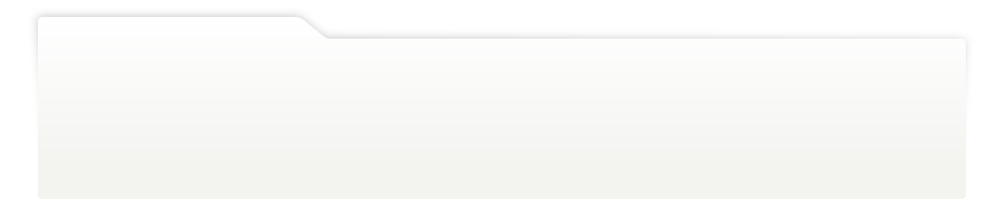
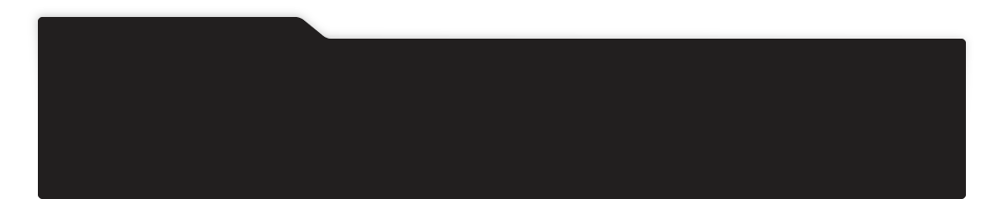
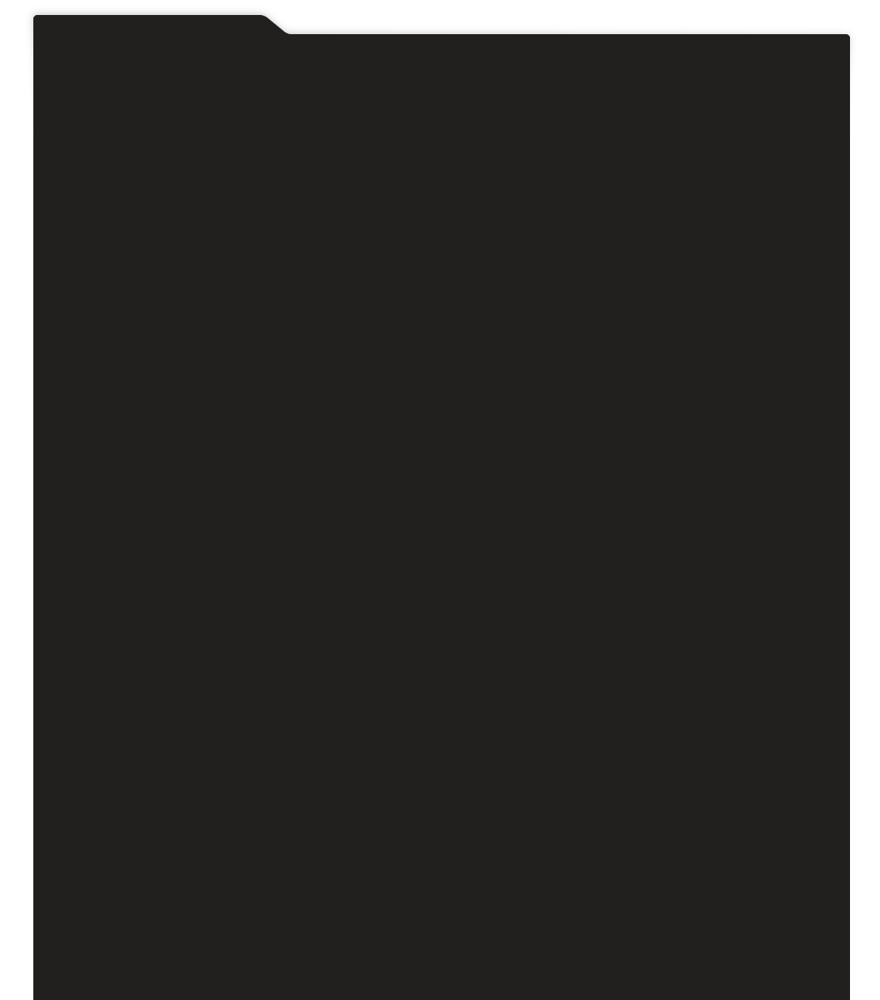
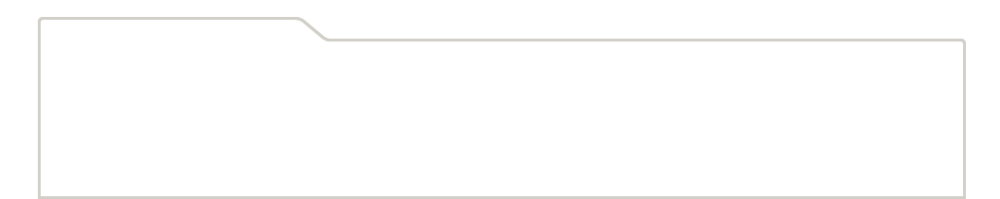
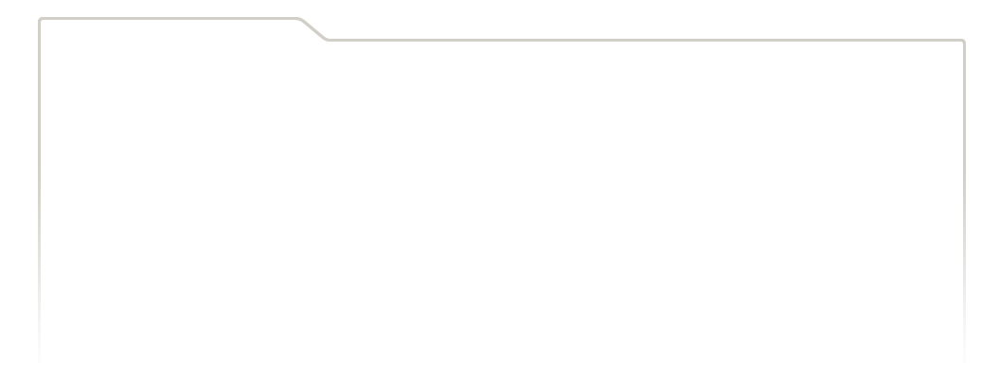
...
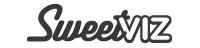
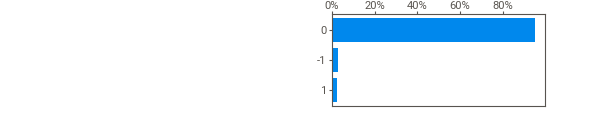
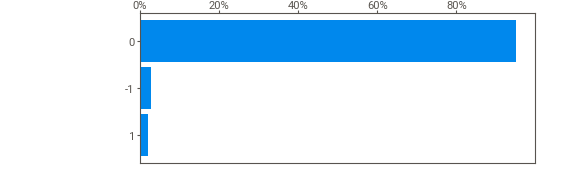
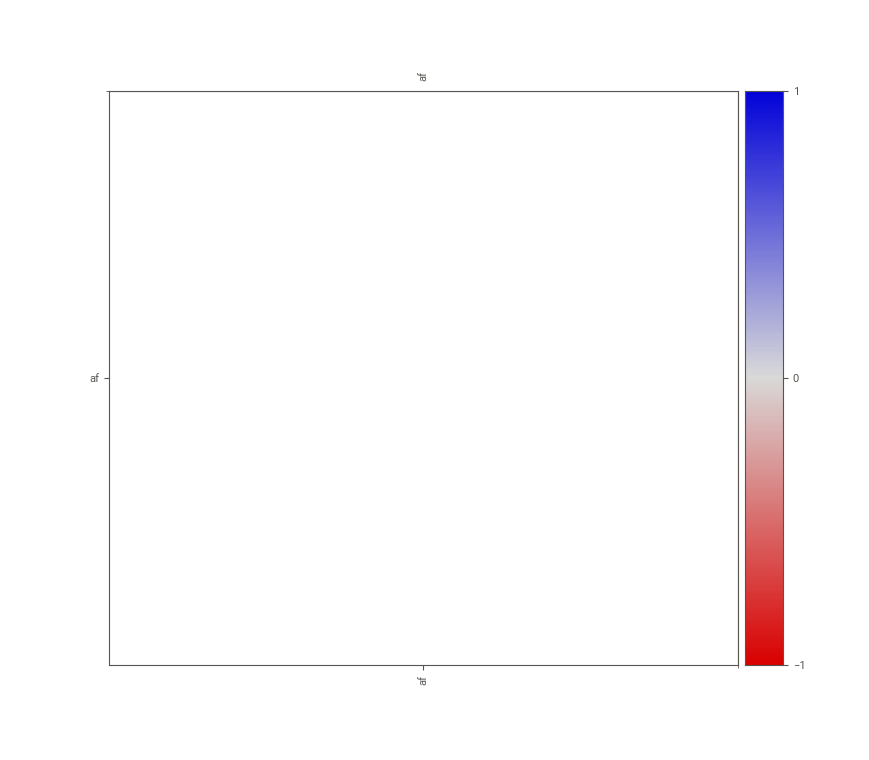
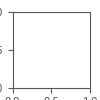

In [30]:
# Generate visual EDA report using Sweetviz 
sv_control_df = sv.analyze([control_df, 'Control Data'])
sv_control_df.show_notebook(layout='widescreen', scale=0.8)

In [31]:
# Delete records with Control = -1
print('before:', control_df.shape)
control_df = control_df[control_df['af']!='-1']
print('after:', control_df.shape)

before: (2880, 2)
after: (2800, 2)


In [32]:
# Convert time column into H:M:S format
control_df['time'] = control_df['time'].str[:- 4]

# Convert into time dtypes
control_df['time'] = pd.to_datetime(control_df['time'], format='%H:%M:%S')

control_df.head()

,time,af
0,1900-01-01 16:00:11,0
1,1900-01-01 16:00:41,0
2,1900-01-01 16:01:11,0
3,1900-01-01 16:01:41,0
4,1900-01-01 16:02:11,0


In [33]:
# Generate 30s time stamp for df_label_new
control_df['time_30'] = control_df['time'].map(lambda x: pd.date_range(start=x, periods=30, freq='s'))
control_df.head()

,time,af,time_30
0,1900-01-01 16:00:11,0,"DatetimeIndex(['1900-01-01 16:00:11', '1900-01..."
1,1900-01-01 16:00:41,0,"DatetimeIndex(['1900-01-01 16:00:41', '1900-01..."
2,1900-01-01 16:01:11,0,"DatetimeIndex(['1900-01-01 16:01:11', '1900-01..."
3,1900-01-01 16:01:41,0,"DatetimeIndex(['1900-01-01 16:01:41', '1900-01..."
4,1900-01-01 16:02:11,0,"DatetimeIndex(['1900-01-01 16:02:11', '1900-01..."


In [34]:
# Check
print(control_df['time_30'][0])
print(control_df['time_30'][1])

DatetimeIndex(['1900-01-01 16:00:11', '1900-01-01 16:00:12',
               '1900-01-01 16:00:13', '1900-01-01 16:00:14',
               '1900-01-01 16:00:15', '1900-01-01 16:00:16',
               '1900-01-01 16:00:17', '1900-01-01 16:00:18',
               '1900-01-01 16:00:19', '1900-01-01 16:00:20',
               '1900-01-01 16:00:21', '1900-01-01 16:00:22',
               '1900-01-01 16:00:23', '1900-01-01 16:00:24',
               '1900-01-01 16:00:25', '1900-01-01 16:00:26',
               '1900-01-01 16:00:27', '1900-01-01 16:00:28',
               '1900-01-01 16:00:29', '1900-01-01 16:00:30',
               '1900-01-01 16:00:31', '1900-01-01 16:00:32',
               '1900-01-01 16:00:33', '1900-01-01 16:00:34',
               '1900-01-01 16:00:35', '1900-01-01 16:00:36',
               '1900-01-01 16:00:37', '1900-01-01 16:00:38',
               '1900-01-01 16:00:39', '1900-01-01 16:00:40'],
              dtype='datetime64[ns]', freq='S')
DatetimeIndex(['1900-01-01 16:00:41'

In [35]:
# Explode the time_30 column
control_df = control_df.explode('time_30')
control_df['time_30'] = control_df['time_30'].dt.time # Get the H:M:S format
control_df['time_30'] = control_df['time_30'].astype(str) # Convert to string for inner join with ECG data
print(control_df.shape)
control_df.head(40)

(84000, 3)


,time,af,time_30
0,1900-01-01 16:00:11,0,16:00:11
0,1900-01-01 16:00:11,0,16:00:12
0,1900-01-01 16:00:11,0,16:00:13
0,1900-01-01 16:00:11,0,16:00:14
0,1900-01-01 16:00:11,0,16:00:15
0,1900-01-01 16:00:11,0,16:00:16
0,1900-01-01 16:00:11,0,16:00:17
0,1900-01-01 16:00:11,0,16:00:18
0,1900-01-01 16:00:11,0,16:00:19
0,1900-01-01 16:00:11,0,16:00:20


In [36]:
control_df.tail(40)

,time,af,time_30
2877,1900-01-01 15:58:41,0,15:59:01
2877,1900-01-01 15:58:41,0,15:59:02
2877,1900-01-01 15:58:41,0,15:59:03
2877,1900-01-01 15:58:41,0,15:59:04
2877,1900-01-01 15:58:41,0,15:59:05
2877,1900-01-01 15:58:41,0,15:59:06
2877,1900-01-01 15:58:41,0,15:59:07
2877,1900-01-01 15:58:41,0,15:59:08
2877,1900-01-01 15:58:41,0,15:59:09
2877,1900-01-01 15:58:41,0,15:59:10


In [37]:
# Drop unnecessary columns
control_df_preproc = control_df.drop(['time'], axis=1)
print(control_df_preproc.shape)
control_df_preproc.head()

(84000, 2)


,af,time_30
0,0,16:00:11
0,0,16:00:12
0,0,16:00:13
0,0,16:00:14
0,0,16:00:15


In [38]:
# Drop duplicates, if any
print('before:', control_df_preproc.shape)
control_df_preproc.drop_duplicates()
print('after:', control_df_preproc.shape)

before: (84000, 2)
after: (84000, 2)


## Join ECG & Control Data

In [58]:
# Merge ECG & Control data
ecg_control_df = pd.merge(ecg_df_preproc, control_df_preproc,
                          how='inner', left_on='time', right_on='time_30',
                          left_index=False, right_index=False)

print(ecg_control_df.shape)
ecg_control_df.head(10)

(97451, 4)


,time,rr_interval,af,time_30
0,16:00:11,935,0,16:00:11
1,16:00:12,810,0,16:00:12
2,16:00:13,815,0,16:00:13
3,16:00:14,815,0,16:00:14
4,16:00:15,815,0,16:00:15
5,16:00:15,805,0,16:00:15
6,16:00:16,800,0,16:00:16
7,16:00:17,805,0,16:00:17
8,16:00:18,805,0,16:00:18
9,16:00:19,820,0,16:00:19


In [59]:
# Drop unnecessary columns
ecg_control_df = ecg_control_df.drop(['time_30'], axis=1)

# Drop duplicates, if any
print('before:', ecg_control_df.shape)
ecg_control_df.drop_duplicates()
print('after:', ecg_control_df.shape)

# Reset index
ecg_control_df = ecg_control_df.reset_index(drop=True)
ecg_control_df.head()

before: (97451, 3)
after: (97451, 3)


,time,rr_interval,af
0,16:00:11,935,0
1,16:00:12,810,0
2,16:00:13,815,0
3,16:00:14,815,0
4,16:00:15,815,0


Text(0.5, 1.0, 'AF Cases RR Interval Density Plot')

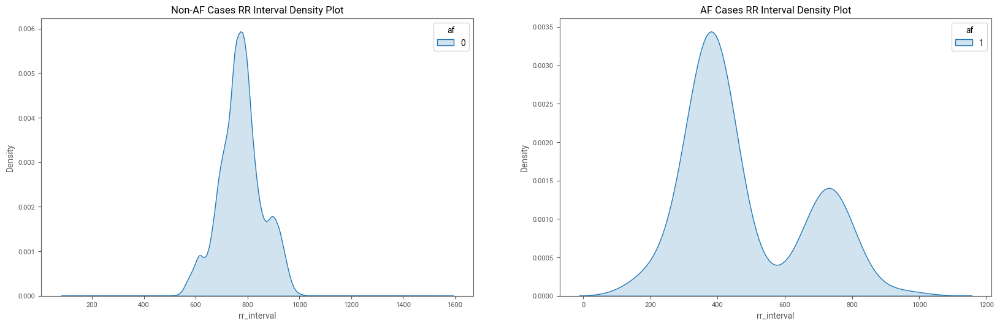

In [84]:
ecg_control_df_af0 = ecg_control_df[ecg_control_df['af']=='0']
ecg_control_df_af1 = ecg_control_df[ecg_control_df['af']=='1']

fig, axes = plt.subplots(1, 2, figsize=(20, 6))
sns.kdeplot(ax=axes[0], data=ecg_control_df_af0, x='rr_interval', hue='af', palette='tab10', linewidth=1, fill=True, alpha=.2)
sns.kdeplot(ax=axes[1], data=ecg_control_df_af1, x='rr_interval', hue='af', palette='tab10', linewidth=1, fill=True, alpha=.2)

axes[0].set_title('Non-AF Cases RR Interval Density Plot')
axes[1].set_title('AF Cases RR Interval Density Plot')

## Create in fixed-width sliding windows of 30 secs and 50% (15 secs) overlap

In [130]:
rr_interval_list = []
af_list = []
window_size = 30
step_size = 15

# Creating overlaping windows of 30 secs and 50% overlap
for i in range(0, ecg_control_df.shape[0]-window_size, step_size):
    rr_intervals = ecg_control_df['rr_interval'].values[i:i+window_size]
    afs = stats.mode(ecg_control_df['af'][i:i+window_size])[0][0]
    rr_interval_list.append(rr_intervals)
    af_list.append(afs)

In [131]:
rr_interval_list[-3:]

[array([780, 775, 785, 800, 800, 805, 795, 785, 795, 800, 800, 795, 815,
        825, 800, 800, 800, 795, 800, 800, 800, 810, 815, 795, 810, 790,
        775, 770, 770, 760]),
 array([800, 800, 795, 800, 800, 800, 810, 815, 795, 810, 790, 775, 770,
        770, 760, 750, 755, 760, 745, 765, 410, 760, 760, 755, 755, 750,
        765, 770, 770, 770]),
 array([750, 755, 760, 745, 765, 410, 760, 760, 755, 755, 750, 765, 770,
        770, 770, 775, 775, 805, 785, 780, 780, 775, 775, 760, 770, 755,
        755, 755, 760, 755])]

In [132]:
af_list[-3:]

['0', '0', '0']

In [141]:
# Convert the lists into a DataFrame
rr_af_df = pd.DataFrame({'rr_intervals': rr_interval_list, 'af': af_list})

print(rr_af_df.shape)
rr_af_df.head()

(6495, 2)


,rr_intervals,af
0,"[935, 810, 815, 815, 815, 805, 800, 805, 805, ...",0
1,"[840, 835, 835, 835, 835, 840, 820, 815, 825, ...",0
2,"[790, 805, 810, 800, 795, 790, 790, 775, 785, ...",0
3,"[775, 785, 790, 790, 775, 780, 775, 785, 780, ...",0
4,"[790, 800, 815, 795, 800, 800, 795, 800, 790, ...",0


In [142]:
rr_af_df.dtypes

rr_intervals    object
af              object
dtype: object